In [24]:
# import libraries
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, Rectangle
from matplotlib.lines import Line2D
import matplotlib.cm as cm
from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
from PIL import Image
import pandas as pd
weatherclimateED = pd.read_csv("weatherclimateED.csv", parse_dates = [0], dayfirst = True)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import itertools
import statsmodels.api as sm
from pycirclize import Circos
from scipy.stats import gaussian_kde
from joblib import Parallel, delayed
import os
import itertools
import patchworklib as pw 

<Figure size 100x100 with 0 Axes>

In [2]:
from epiweeks import Week, Year
from datetime import date
def create_epiweek(date):
    return Week.fromdate(date)
def create_epiweekplot(epiweek):
    epiweek = str(epiweek)
    return F'Y{epiweek[:4]}W{epiweek[4:]}'
def create_epiweek_fromstr(str):
    return Week.fromstring(str)
def create_epiweek_fromint(int):
    return Week.fromstring(str(int))

In [3]:
# def find_min_model(lag, step, target_var, error_metric_directory, error_metric):
#     error_file_path = os.path.join(target_var, error_metric_directory, F'L{lag}_S{step}.csv')
#     if os.path.isfile(error_file_path):
#         error_df = pd.read_csv(error_file_path)
#         min_val = error_df[error_metric].min()*100
#         min_model = error_df.iloc[error_df[error_metric].idxmin(), 0]
#     else:
#         min_val = 0
#         min_model = 'N/A'
#     return min_val, min_model

In [4]:
# def find_min_max(circos_df, step_list):
#     min_max = pd.DataFrame()
#     for step in step_list:
#         min_max.at[F'step{step}', 'min'] = circos_df[step]['min_val'].min()
#         min_max.at[F'step{step}', 'max'] = circos_df[step]['min_val'].max()
#     return min_max

# min_max = find_min_max(circos_df, [1,2,3,4,5,6,7,8,9,10,11,12])
# min_max['max'].max()

# min_max['min'].min()

In [5]:
# To change the name of models in the labels of the plots
# normal models are simple models, combinations
normal_model = {}

normal_model['naive'] = 'Naive'
normal_model['historymean'] = 'HM'
normal_model['ar_pure'] = 'AR(A)'
normal_model['ar_env'] = 'AR(B)'
normal_model['ridge'] = 'Ridge'
normal_model['lasso'] = 'LASSO'
normal_model['alasso'] = 'ALASSO'
normal_model['sgl'] = 'SGL'
normal_model['elasticnet'] = 'ENET'
normal_model['purefactor'] = 'PF'
normal_model['knn'] = 'KNN'
normal_model['xgboost'] = 'XGBoost'
normal_model['linearpool_P1'] = 'linear pool (P1)'
normal_model['linearpool_P2'] = 'linear pool (P2)'
normal_model['linearpool_P3'] = 'linear pool (P3)'
normal_model['harmonicpool_P1'] = 'harmonic pool (P1)'
normal_model['harmonicpool_P2'] = 'harmonic pool (P2)'
normal_model['harmonicpool_P3'] = 'harmonic pool (P3)'
normal_model['logpool_P1'] = 'log pool (P1)'
normal_model['logpool_P2'] = 'log pool (P2)'
normal_model['logpool_P3'] = 'log pool (P3)'
normal_model['vincentization_P1'] = 'vincentization (P1)'
normal_model['vincentization_P2'] = 'vincentization (P2)'
normal_model['vincentization_P3'] = 'vincentization (P3)'


# For subsequent traversals
all_models = ['naive', 'historymean', 'ar_pure', 'ar_env', 'ridge', 'lasso', 'alasso', 'sgl',
                 'elasticnet', 'purefactor', 'knn', 'xgboost']
all_combinations = ['linearpool_P1', 'linearpool_P2', 'linearpool_P3', 'harmonicpool_P1', 'harmonicpool_P2', 'harmonicpool_P3',
                   'logpool_P1', 'logpool_P2', 'logpool_P3', 'vincentization_P1', 'vincentization_P2', 'vincentization_P3'] 

## ploting the time series of actual and forecasts

In [232]:
def single_plot(pred, lag, step, target_var, model, output_directory): # for density forecast submodels and combi density forecast
    output_directory_path = os.path.join(output_directory, target_var)
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    output_file = os.path.join(output_directory_path, F'{model} {step}-week.pdf')
    
    y_pred = pred.copy()
    fig, ax1 = plt.subplots(1,1, figsize=(16,6))
    # Set the x-axis limits
    plt.xlim([0,len(pred)])

    # Shade the training dataset
    epiweek_values = list(y_pred.index.values)
    first_valid_index = epiweek_values.index(y_pred['0'].first_valid_index()) # becasue the length of columns '0'-'999' is different from column target_var
    plt.axvspan(0, first_valid_index, facecolor='#d9d9d9', alpha=0.5)
    

    
    # Plot the polygon
    percentiles = np.linspace(0, 100, 101)
    cmap = cm.get_cmap('Greens')

    add_lable = True
    for p in reversed(percentiles):
        if p >= 100-p:
            upper_bound = []
            lower_bound = []
            for index, row in y_pred.iterrows():
                upper_bound.append(np.percentile(np.array(row[1:-1]), p))
                lower_bound.append(np.percentile(np.array(row[1:-1]), 100 - p))
            color_intensity = 1 - (p - 50) / 50  # Closer to 50% is darker
            color = cmap(color_intensity)
            ax1.fill_between(y_pred['epiweekplot'], lower_bound, upper_bound, color=color, alpha=1, label='   Percentile' if add_lable else None)
            add_lable = False
    
    # Plot the line
    ax1.plot(y_pred['epiweekplot'][:first_valid_index+1], y_pred[target_var][:first_valid_index+1], label='   Actual in train set', linestyle='-', linewidth=1.2, alpha=1, color='black')
    ax1.plot(y_pred['epiweekplot'][first_valid_index:], y_pred[target_var][first_valid_index:], label='   Actual in forecast set', linestyle='-', linewidth=1.2, alpha=1, color='#CC0000')
    
    # Plot settings
    ax1.set_xticks(y_pred['epiweekplot'][::52])
    ax1.set_xticklabels("")
    
    ax1.set_xticks(y_pred['epiweekplot'][26::52], minor=True)
    start_range = int(y_pred['epiweekplot'][0][1:5])
    end_range = int(y_pred['epiweekplot'][-1][1:5])+1
    ax1.set_xticklabels(range(start_range,end_range), minor=True)

    ax1.tick_params(axis='x', which='minor', length=0, width=0, pad=7.5, labelsize=18)
    ax1.tick_params(axis='y', which='major', length=5, width=1, pad=7.5, labelsize=18)

    plt.title(F'{target_var} {step}-week ahead {normal_model[model]} forecast', fontsize=18)
    plt.xlabel('Year', fontsize=18)
    plt.ylabel('ED Admissions', fontsize=18)




    # Add color bars
    reversed_cmap = cmap.reversed()
    colors = cmap(np.linspace(0, 1, 100))  # First half (0-50)
    colors_reversed = reversed_cmap(np.linspace(0, 1, 128))  # Second half (50-100)
    symmetric_colors = np.vstack((colors, colors_reversed))  # Stack them vertically
    symmetric_cmap = LinearSegmentedColormap.from_list("symmetric_Greens", symmetric_colors)

    norm = Normalize(vmin=0, vmax=100)
    sm = ScalarMappable(cmap=symmetric_cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax1, orientation='vertical', fraction=0.03, shrink=0.08, aspect=1.3)
    cbar.ax.tick_params(labelsize=7)
    cbar.ax.set_position([0.139, 0.77, 0.02, 0.09])
    cbar.set_ticks([0, 50, 100])
    cbar.set_ticklabels(['0%', '50%', '100%'])

    
    plt.legend(loc='upper left', fontsize=18)
    plt.savefig(output_file)
#     plt.show()

def data_setup(lag, step, target_var, model):
    if model in all_models:
        y_pred = pd.read_csv(F'{target_var}/pred/L{lag}_S{step}/{model}.csv', parse_dates = [0], dayfirst = True)
    else:
        y_pred = pd.read_csv(F'{target_var}/combi_samples/L{lag}_S{step}/{model}.csv', parse_dates = [0], dayfirst = True)

    y_pred['epiweek'] = y_pred['epiweek'].apply(create_epiweek_fromstr)
    y_pred = y_pred.set_index('epiweek')
    y_pred = y_pred.drop(target_var, axis=1)


    y_full = pd.read_csv(F'{target_var}/initial_dataset.csv', parse_dates = [0], dayfirst = True)
    y_full['epiweek'] = y_full['epiweek'].apply(create_epiweek_fromstr)
    y_full = y_full.set_index('epiweek')
    y_full = y_full[[target_var]]
    y_full = y_full.shift(-step+1).dropna()


    y_pred_full = pd.concat([y_full, y_pred], axis=1)
    y_pred_full['epiweekplot'] = y_pred_full.index
    y_pred_full['epiweekplot'] = y_pred_full['epiweekplot'].apply(create_epiweekplot)

    return y_pred_full

def plot_individual(lag, step, target_var, model, output_directory):
    y_pred = data_setup(lag, step, target_var, model)
    single_plot(y_pred, lag, step, target_var, model, output_directory)




def plot_disease(lag, step, target_variables_file, model, output_directory):
    target_variables = []
    with open(target_variables_file, 'r') as file:
        for line in file:
            # Remove linebreak which is the last character of the string
            target_variable = line[:-1]
            # Add item to the list
            target_variables.append(target_variable)
    print(target_variables)
    for disease in target_variables:
        plot_individual(lag, step, disease, model, output_directory)


# for step in range(1, 13):
#     for model in all_models + all_combinations:
#         plot_disease(8, step, 'target_variables_new.txt', model, 'epiweekplot')

combinations = list(itertools.product(range(1, 13), all_models + all_combinations))
Parallel(n_jobs=-1, verbose=51)(delayed(plot_disease)(8, step, 'target_variables_new.txt', model, 'epiweekplot') for step, model in combinations)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


/Users/guopeihong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/guopeihong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/guopeihong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/guopeihong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/guopeihong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: Us

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarn

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure pars

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure pars

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  2.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  2.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:  2.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:  2.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:  3.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:  3.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:  3.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:  3.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:  3.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:  3.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:  6.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  6.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  6.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  6.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  6.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:  6.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:  6.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:  6.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:  7.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:  7.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:  7.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:  7.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  9.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  9.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:  9.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  9.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed: 10.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed: 10.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 10.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed: 10.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 10.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 10.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done  35 tasks      | elapsed: 10.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed: 10.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 13.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed: 13.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  39 tasks      | elapsed: 13.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed: 13.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed: 13.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 13.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  43 tasks      | elapsed: 13.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed: 13.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 14.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 14.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  47 tasks      | elapsed: 14.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed: 14.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed: 16.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed: 16.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  51 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed: 16.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed: 17.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed: 17.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  55 tasks      | elapsed: 17.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed: 17.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed: 17.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed: 18.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  59 tasks      | elapsed: 18.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed: 18.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed: 20.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed: 20.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done  63 tasks      | elapsed: 20.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 20.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed: 20.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed: 21.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done  67 tasks      | elapsed: 21.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 21.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed: 21.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed: 21.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  71 tasks      | elapsed: 21.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed: 21.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed: 23.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed: 24.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  75 tasks      | elapsed: 24.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed: 24.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed: 24.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed: 24.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positio

[Parallel(n_jobs=-1)]: Done  79 tasks      | elapsed: 24.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed: 24.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed: 25.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed: 25.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed: 25.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed: 25.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed: 27.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed: 27.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  87 tasks      | elapsed: 27.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed: 27.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed: 28.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed: 28.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done  91 tasks      | elapsed: 28.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed: 28.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed: 28.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed: 28.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done  95 tasks      | elapsed: 29.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed: 29.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed: 31.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure pars

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done  98 tasks      | elapsed: 31.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done  99 tasks      | elapsed: 31.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed: 31.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed: 31.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 102 tasks      | elapsed: 31.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 103 tasks      | elapsed: 32.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed: 32.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed: 32.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 106 tasks      | elapsed: 32.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 107 tasks      | elapsed: 32.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed: 32.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 109 tasks      | elapsed: 34.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 110 tasks      | elapsed: 35.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 111 tasks      | elapsed: 35.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed: 35.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed: 35.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed: 35.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 115 tasks      | elapsed: 35.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed: 36.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 117 tasks      | elapsed: 36.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 118 tasks      | elapsed: 36.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 119 tasks      | elapsed: 36.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed: 36.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed: 38.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 122 tasks      | elapsed: 38.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 123 tasks      | elapsed: 39.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed: 39.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 125 tasks      | elapsed: 39.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 126 tasks      | elapsed: 39.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done 127 tasks      | elapsed: 39.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed: 39.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed: 39.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed: 40.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 131 tasks      | elapsed: 40.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed: 40.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__geti

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed: 42.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed: 42.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed: 42.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed: 42.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed: 42.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed: 42.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed: 43.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed: 43.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed: 43.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed: 43.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed: 43.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed: 44.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed: 45.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 46.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed: 46.4min
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed: 46.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed: 46.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed: 46.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 151 tasks      | elapsed: 47.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed: 47.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 153 tasks      | elapsed: 47.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 47.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 155 tasks      | elapsed: 47.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed: 47.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed: 49.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 50.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 159 tasks      | elapsed: 50.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed: 50.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed: 50.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed: 50.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 163 tasks      | elapsed: 50.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed: 50.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed: 51.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 166 tasks      | elapsed: 51.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 167 tasks      | elapsed: 51.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed: 51.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed: 53.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 170 tasks      | elapsed: 53.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 171 tasks      | elapsed: 53.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed: 53.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed: 54.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 174 tasks      | elapsed: 54.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 175 tasks      | elapsed: 54.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 54.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 177 tasks      | elapsed: 54.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 178 tasks      | elapsed: 54.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 179 tasks      | elapsed: 54.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed: 55.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 181 tasks      | elapsed: 57.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 182 tasks      | elapsed: 57.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 183 tasks      | elapsed: 57.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 57.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 185 tasks      | elapsed: 57.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 186 tasks      | elapsed: 57.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 187 tasks      | elapsed: 58.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed: 58.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed: 58.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 190 tasks      | elapsed: 58.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 191 tasks      | elapsed: 58.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 59.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 193 tasks      | elapsed: 60.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed: 61.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 195 tasks      | elapsed: 61.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 61.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed: 61.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 198 tasks      | elapsed: 61.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 199 tasks      | elapsed: 62.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 62.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 201 tasks      | elapsed: 62.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 202 tasks      | elapsed: 62.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 203 tasks      | elapsed: 62.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed: 62.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 205 tasks      | elapsed: 64.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 206 tasks      | elapsed: 64.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 207 tasks      | elapsed: 65.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed: 65.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 209 tasks      | elapsed: 65.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed: 65.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 211 tasks      | elapsed: 65.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed: 65.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 213 tasks      | elapsed: 65.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 214 tasks      | elapsed: 66.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 215 tasks      | elapsed: 66.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed: 66.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed: 68.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed: 68.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 219 tasks      | elapsed: 68.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed: 68.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed: 69.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. 

[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed: 69.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 223 tasks      | elapsed: 69.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 224 tasks      | elapsed: 69.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed: 69.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed: 69.7min
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed: 69.7min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed: 70.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed: 72.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed: 72.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed: 72.6min
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed: 72.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed: 72.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed: 72.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed: 73.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed: 73.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed: 73.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed: 73.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed: 73.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed: 74.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed: 75.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed: 76.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed: 76.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed: 76.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed: 76.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed: 76.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed: 77.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed: 77.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed: 77.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed: 77.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed: 77.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed: 77.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed: 79.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed: 79.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed: 80.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 80.2min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed: 80.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed: 80.4min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed: 80.8min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed: 80.9min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed: 81.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.


[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed: 81.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed: 81.0min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed: 81.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed: 83.1min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:82: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

[Parallel(n_jobs=-1)]: Done 271 out of 288 | elapsed: 84.5min remaining:  5.3min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and wi

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling b

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating 

[Parallel(n_jobs=-1)]: Done 277 out of 288 | elapsed: 86.9min remaining:  3.5min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ver

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_22

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 283 out of 288 | elapsed: 88.1min remaining:  1.6min


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:84: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:91: UserWarning: Could not infer

[Parallel(n_jobs=-1)]: Done 288 out of 288 | elapsed: 88.6min finished


/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/9s/ccryk8_11kzgccj2x6slrxm40000gn/T/ipykernel_2299/920721434.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrine disorders', 'Malignant neoplasms', 'Diabetes mellitus', 'Genitourinary disorders', 'Musculoskeletal disease', 'Infectious and Parasitic Diseases', 'Neurological and sense disorders', 'Oral Diseases', 'Other neoplasms', 'Respiratory Infection', 'Skin diseases']
['Cardiovascular disease', 'Chronic respiratory disease', 'Factors influencing health status and contact with health services', 'Digestive disease', 'Endocrin

## plot metrics by disease

In [7]:
def create_error_df(target_var, error_metric_directory, error_metric):
    directory = os.path.join(target_var, error_metric_directory)
    error_df = pd.DataFrame()
    for step in range(1,13):
        error_file_path = os.path.join(directory, F'L8_S{step}.csv')
        #print(pd.read_csv(error_file_path, index_col=0))

        if os.path.isfile(error_file_path):
            error_df = pd.concat([error_df, pd.read_csv(error_file_path, index_col=0)[error_metric]], axis=1)
    error_df.columns = range(1,13)
    #return error_df.transpose().drop('knn', axis=1)
    return error_df.transpose()

In [8]:
def marker_picker(model):
    marker_dict = {'naive':'d', 
                    'historymean': 'v',
                    'ar_pure': 's',
                    'ar_env': 'P',
                    'ridge': 'd',
                    'lasso': '<',
                    'alasso': '>',
                    'sgl': 'X',
                    'elasticnet': '+',
                    'purefactor': '*',
                    'knn': 'H',
                    'xgboost': '2',
                   
                   'linearpool_P1':'o',
                   'linearpool_P2':'^',
                   'linearpool_P3':'X',
                   
                   'harmonicpool_P1': 'o',
                   'harmonicpool_P2': '^',
                   'harmonicpool_P3': 'X',

                   'logpool_P1': 'o',
                   'logpool_P2': '^',
                   'logpool_P3': 'X',

                   'vincentization_P1': 'o',
                   'vincentization_P2': '^',
                   'vincentization_P3': 'X'}
    return marker_dict[model]

In [12]:
def color_picker(min_model_name):
    color_dict = {
        'naive': 'white',
        'historymean': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.1)),
        'ar_pure': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        'ar_env': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.25)),
        'ridge': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.35)),
        'lasso': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'alasso': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.55)),
        'sgl': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.65)),
        'elasticnet': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.72)),
        'purefactor': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.8)),
        'knn': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.86)),
        'xgboost': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.95)),
        
        'linearpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        'linearpool_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        'linearpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        
        'harmonicpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'harmonicpool_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'harmonicpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        
        'logpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        'logpool_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        'logpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        
        'vincentization_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9)),
        'vincentization_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9)),
        'vincentization_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9))
    }
    return color_dict[min_model_name] 

In [13]:
def rename_disease(str):
    disease_dict = {
        'Factors influencing health status and contact with health services':'Health factors',
        'Cardiovascular disease':'Cardiovascular',
        'Chronic respiratory disease':'Chronic respiratory',
        'Digestive disease':'Digestive',
        'Endocrine disorders':'Endocrine',
        'Genitourinary disorders':'Genitourinary',
        'Infectious and Parasitic Diseases':'Infectious & Parasitic',
        'Musculoskeletal disease':'Musculoskeletal',
        'Neurological and sense disorders':'Neurological & Sense',
        'Oral diseases':'Oral',
        'Respiratory Infection':'Respiratory',
        'Skin diseases':'Skin'
    }

    if str in disease_dict:
        return disease_dict[str]
    else:
        return str

In [14]:
# To change the name of models in the labels of the plots
all_models = {}
all_models['naive'] = 'Naive'
all_models['historymean'] = 'HM'
all_models['ar_pure'] = 'AR(A)'
all_models['ar_env'] = 'AR(B)'
all_models['ridge'] = 'Ridge'
all_models['lasso'] = 'LASSO'
all_models['alasso'] = 'ALASSO'
all_models['sgl'] = 'SGL'
all_models['elasticnet'] = 'ENET'
all_models['purefactor'] = 'PF'
all_models['knn'] = 'KNN'
all_models['xgboost'] = 'XGBoost'
all_models['linearpool_P1'] = 'linear (P1)'
all_models['linearpool_P2'] = 'linear (P2)'
all_models['linearpool_P3'] = 'linear (P3)'
all_models['harmonicpool_P1'] = 'harmonic (P1)'
all_models['harmonicpool_P2'] = 'harmonic (P2)'
all_models['harmonicpool_P3'] = 'harmonic (P3)'
all_models['logpool_P1'] = 'log (P1)'
all_models['logpool_P2'] = 'log (P2)'
all_models['logpool_P3'] = 'log (P3)'
all_models['vincentization_P1'] = 'vincent (P1)'
all_models['vincentization_P2'] = 'vincent (P2)'
all_models['vincentization_P3'] = 'vincent (P3)'

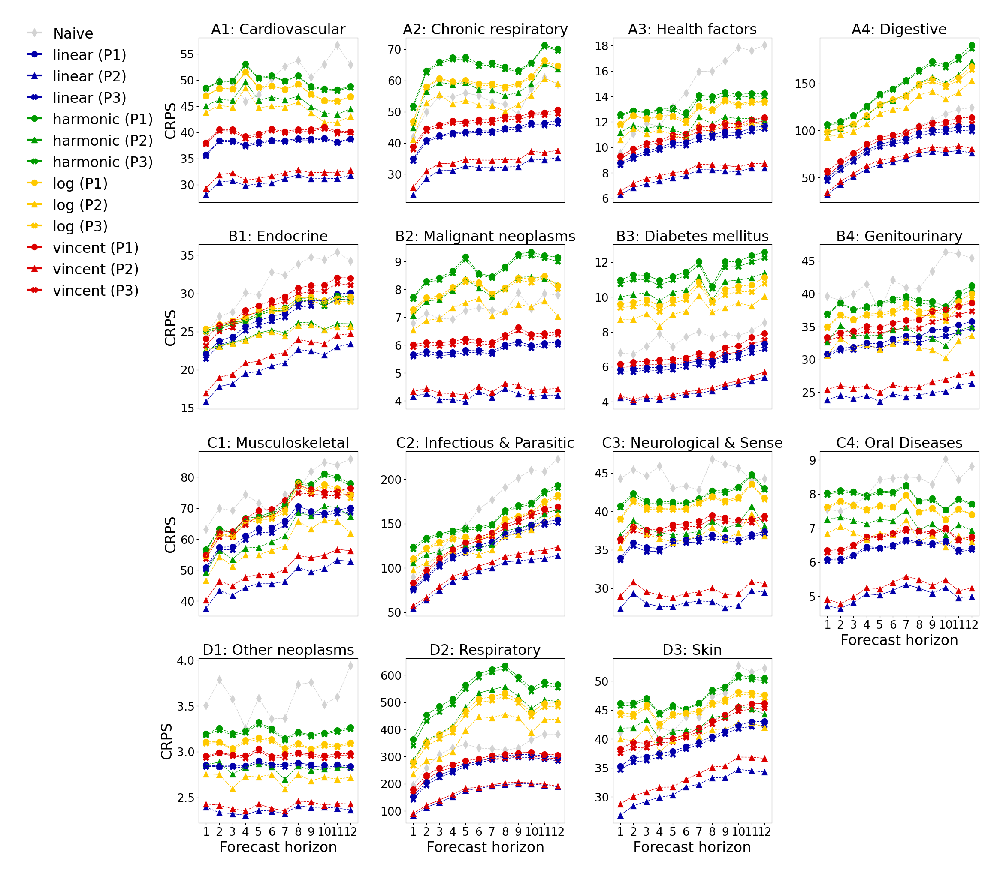

In [12]:
## Plot different combinatinons by disease
def plot_by_disease(target_variables_file, error_metric_directory, error_metric, output_directory_path, output_file):
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    if error_metric == 'crps_DENSITY_FORECAST':
        labs = ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4', 'C1', 'C2', 'C3', 'C4', 'D1', 'D2', 'D3']
    else:
        labs = ['A5', 'A6', 'A7', 'A8', 'B5', 'B6', 'B7', 'B8', 'C5', 'C6', 'C7', 'C8', 'D4', 'D5', 'D6']
    disease_list = []
    with open(target_variables_file, 'r') as file:
        for line in file:
            # Remove linebreak which is the last character of the string
            target_variable = line[:-1]
            # Add item to the list
            disease_list.append(target_variable)
            
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    fig.tight_layout(pad=5.0)
    
    for i, disease in enumerate(disease_list): 
        row, col = divmod(i, 4)
        ax = axs[row, col]
        
        error_df = create_error_df(disease, error_metric_directory, error_metric)


        legend_handles = []
        # Can change depends on what models you want to visualize: all combi[0, 12:24]
        for model in error_df.columns.values[np.r_[0, 12:24]]:   
            color = color_picker(model)
            marker = marker_picker(model)
            if model == 'naive':
                line, = ax.plot(error_df.index.values, error_df[model], linestyle='--', linewidth=1, color='lightgrey')
                scatter = ax.scatter(error_df.index.values, error_df[model], marker=marker, s=120, color='lightgrey')
            else:
                line, = ax.plot(error_df.index.values, error_df[model], linestyle='--', linewidth=1, color=color)
                scatter = ax.scatter(error_df.index.values, error_df[model], marker=marker, s=120, color=color)
            # Create a legend handle combining line and scatter
            legend_handle = mpl.lines.Line2D([], [], color=line.get_color(), marker=marker, linestyle=line.get_linestyle(), markersize=10, linewidth=3)
            legend_handles.append((legend_handle, all_models.get(model, model)))
            
        ax.set_title(f'{labs[i]}: {rename_disease(disease)}', fontsize=24)
        if row == 3 or (row == 2 and col == 3):
            ax.set_xlabel('Forecast horizon', fontsize=24)
            x_ticks = np.arange(1, len(error_df.index.values)+1)  # Assuming error_df.index.values are numerical
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(error_df.index.values)
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
            
        if col == 0:
            if error_metric == 'crps_DENSITY_FORECAST':
                ax.set_ylabel(error_metric[:-17].upper(), fontsize=24)
            else:
                ax.set_ylabel(error_metric[:-17], fontsize=24)
            
        if row == 0 and col == 0:
            # Reorder the legend handles and labels
            custom_order = [0, 9, 5, 1, 10, 6, 2, 11, 7, 3, 12, 8, 4]
            reordered_handles = [legend_handles[i][0] for i in custom_order]
            reordered_labels = [legend_handles[i][1] for i in custom_order]
            
            ax.legend(reordered_handles, reordered_labels, bbox_to_anchor=(-0.25, 1.1), loc=0, borderaxespad=0, fontsize=24)
            
        ax.tick_params(axis='both', labelsize=19) 

    if len(disease_list) == 15:
        fig.delaxes(axs[3, 3])  # This removes the last (16th) subplot
        
    output_file = os.path.join(output_directory_path, output_file)
    plt.savefig(output_file)
        

plot_by_disease('target_variables_new.txt', 'density_forecast_metrics', 'crps_DENSITY_FORECAST', 'for_plots', 'all_combi_CRPS.pdf')
# plot_by_disease('target_variables_new.txt', 'density_forecast_metrics', 'log_DENSITY_FORECAST', 'for_plots', 'all_combi_log.pdf')

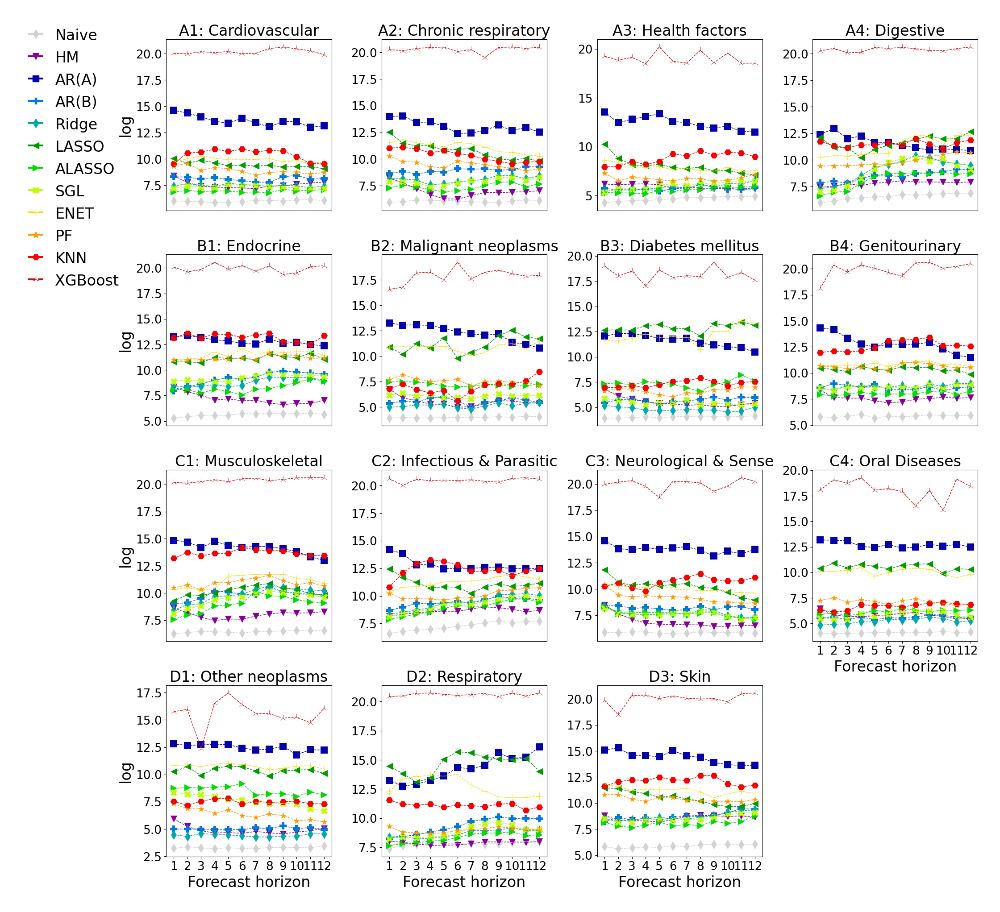

In [31]:
## Plot different individual models by disease
def plot_by_disease(target_variables_file, error_metric_directory, error_metric, output_directory_path, output_file):
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    if error_metric == 'crps_DENSITY_FORECAST':
        labs = ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4', 'C1', 'C2', 'C3', 'C4', 'D1', 'D2', 'D3']
    else:
        labs = ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4', 'C1', 'C2', 'C3', 'C4', 'D1', 'D2', 'D3']
    disease_list = []
    with open(target_variables_file, 'r') as file:
        for line in file:
            # Remove linebreak which is the last character of the string
            target_variable = line[:-1]
            # Add item to the list
            disease_list.append(target_variable)
            
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    fig.tight_layout(pad=5.0)
    
    for i, disease in enumerate(disease_list): 
        row, col = divmod(i, 4)
        ax = axs[row, col]
        
        error_df = create_error_df(disease, error_metric_directory, error_metric)


        legend_handles = []
        
        for model in error_df.columns.values[np.r_[0:12]]:   
            color = color_picker(model)
            marker = marker_picker(model)
            if model == 'naive':
                line, = ax.plot(error_df.index.values, error_df[model], linestyle='--', linewidth=1, color='lightgrey')
                scatter = ax.scatter(error_df.index.values, error_df[model], marker=marker, s=120, color='lightgrey')
            else:
                line, = ax.plot(error_df.index.values, error_df[model], linestyle='--', linewidth=1, color=color)
                scatter = ax.scatter(error_df.index.values, error_df[model], marker=marker, s=120, color=color)
            # Create a legend handle combining line and scatter
            legend_handle = mpl.lines.Line2D([], [], color=line.get_color(), marker=marker, linestyle=line.get_linestyle(), markersize=10, linewidth=3)
            legend_handles.append((legend_handle, all_models.get(model, model)))
            
        ax.set_title(f'{labs[i]}: {rename_disease(disease)}', fontsize=24)
        if row == 3 or (row == 2 and col == 3):
            ax.set_xlabel('Forecast horizon', fontsize=24)
            x_ticks = np.arange(1, len(error_df.index.values)+1)  # Assuming error_df.index.values are numerical
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(error_df.index.values)
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
            
        if col == 0:
            if error_metric == 'crps_DENSITY_FORECAST':
                ax.set_ylabel(error_metric[:-17].upper(), fontsize=24)
            else:
                ax.set_ylabel(error_metric[:-17], fontsize=24)
            
        if row == 0 and col == 0:
            handles, labels = zip(*legend_handles)
            ax.legend(handles, labels, bbox_to_anchor=(-0.25, 1.1), loc=0, borderaxespad=0, fontsize=24)
            
        ax.tick_params(axis='both', labelsize=19) 

    if len(disease_list) == 15:
        fig.delaxes(axs[3, 3])  # This removes the last (16th) subplot
        
    output_file = os.path.join(output_directory_path, output_file)
    plt.savefig(output_file)
        

# plot_by_disease('target_variables_new.txt', 'density_forecast_metrics', 'crps_DENSITY_FORECAST', 'for_plots', 'individual_CRPS.pdf')
plot_by_disease('target_variables_new.txt', 'density_forecast_metrics', 'log_DENSITY_FORECAST', 'for_plots', 'individual_log.pdf')

In [46]:
def color_picker_for_ratio(min_model_name):
    color_dict = {
        'naive': 'white',
        'historymean': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.1)),
        'ar_pure': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        'ar_env': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.25)),
        'ridge': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.35)),
        'lasso': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'alasso': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.55)),
        'sgl': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.65)),
        'elasticnet': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.72)),
        'purefactor': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.8)),
        'knn': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.86)),
        'xgboost': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.95)),
        
        'linearpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        'linearpool_P2': '#a40000',
        'linearpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.15)),
        
        'harmonicpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'harmonicpool_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        'harmonicpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.45)),
        
        'logpool_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        'logpool_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        'logpool_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.75)),
        
        'vincentization_P1': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9)),
        'vincentization_P2': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9)),
        'vincentization_P3': mpl.colors.to_hex(mpl.cm.nipy_spectral(0.9))
    }
    return color_dict[min_model_name] 

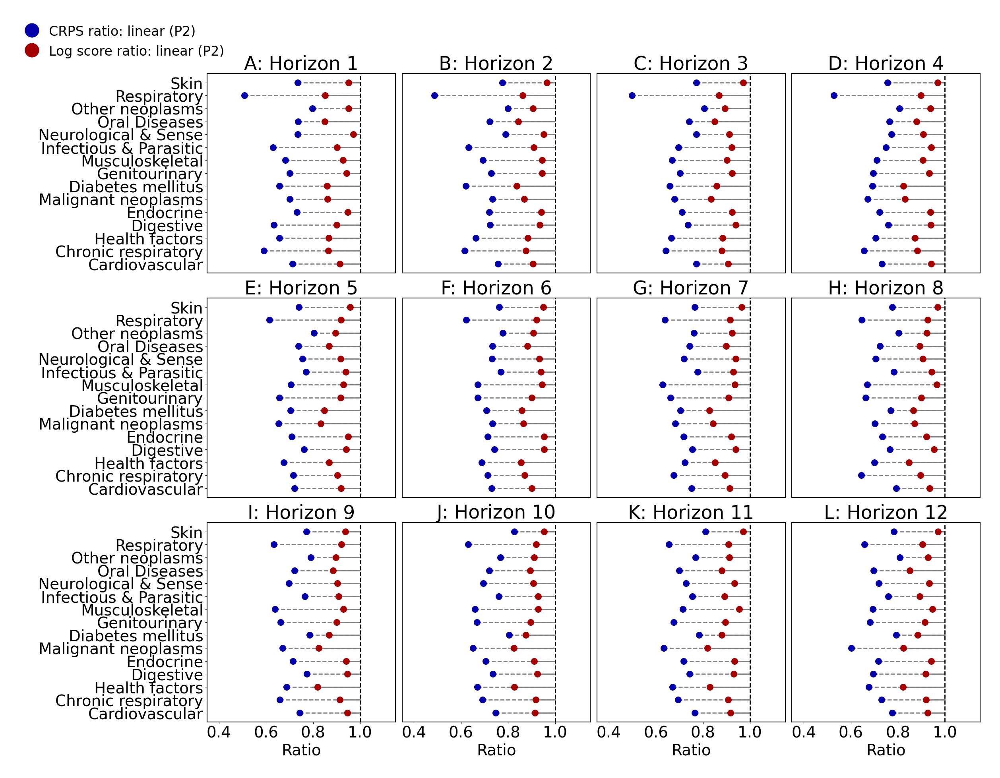

In [49]:
def plot_combined_plot(target_variables_file, error_metric_directory, crps_metric, log_metric, output_directory_path, output_file):
    # Create output directory if it doesn't exist
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    
    labs = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L']
    # Read diseases from file
    disease_list = []
    with open(target_variables_file, 'r') as file:
        for line in file:
            disease = line.strip()
            disease_list.append(disease)
    # Rename diseases to D1 to D15
    disease_labels = [rename_disease(D) for D in disease_list]
    disease_mapping = dict(zip(disease_list, disease_labels))
    
    # Collect legend elements
    legend_elements = {}
    fig, axs = plt.subplots(3, 4, figsize=(24, 18))
    fig.tight_layout(pad=5.0)
    
    for h in range(1, 13):
        # Calculate subplot position
        row = ((h - 1) // 4)
        col = (h - 1) % 4
        ax = axs[row, col]

#         ax.set_facecolor('#FBF4F3') # #FBF9F4
        
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)

        for error_metric, label_prefix in [(crps_metric, 'CRPS'), (log_metric, 'Log score')]:
            ratios = []
            y_positions = []
            colors = []
            for d_idx, disease in enumerate(disease_list):
                # Read error data for the disease
                error_df = create_error_df(disease, error_metric_directory, error_metric)
                error_series = error_df.loc[h]
                
                # Get model names
                models = error_df.columns.values
                individual_models = models[0:12]  # Adjust indices if necessary
                combination_models = models[12:]  # Adjust indices if necessary

                # Get minimum error among individual models
                min_individual_error = error_series[individual_models].min()
                min_individual_model = error_series[individual_models].idxmin()

                # Get minimum error among combination models
                min_combination_error = error_series[combination_models].min()
                min_combination_model = error_series[combination_models].idxmin()

                # Compute ratio
                ratio = min_combination_error / min_individual_error
                ratios.append(ratio)
                y_positions.append(d_idx)

                # Determine color based on the model
                if label_prefix == 'CRPS':
                    if ratio > 1:
                        color = color_picker(min_individual_model)
                        legend_key = f'{label_prefix} ratio: {all_models[min_individual_model]}'
                    else:
                        color = color_picker(min_combination_model)
                        legend_key = f'{label_prefix} ratio: {all_models[min_combination_model]}'
                    colors.append(color)

                    if legend_key not in legend_elements:
                        legend_elements[legend_key] = color

                    # Plot the point
                    ax.scatter(ratio, d_idx, s=150, color=color, zorder=2)

                    # Draw a vertical dashed line from the point to x=1                
                    ax.plot([ratio, 1], [d_idx, d_idx], linestyle='--', linewidth=2, color='gray', zorder=1)
                else:
                    if ratio > 1:
                        color = color_picker_for_ratio(min_individual_model)
                        legend_key = f'{label_prefix} ratio: {all_models[min_individual_model]}'
                    else:
                        color = color_picker_for_ratio(min_combination_model)
                        legend_key = f'{label_prefix} ratio: {all_models[min_combination_model]}'
                    colors.append(color)

                    if legend_key not in legend_elements:
                        legend_elements[legend_key] = color

                    # Plot the point
                    ax.scatter(ratio, d_idx, s=150, color=color, zorder=2)

                    # Draw a vertical dashed line from the point to x=1                
                    ax.plot([ratio, 1], [d_idx, d_idx], linestyle='-', linewidth=2, color='gray', zorder=1)

        # Set x-axis limits and draw vertical dashed line at x=1
        ax.set_xlim(0.35, 1.15)
        ax.axvline(x=1, linestyle='--', linewidth=2, color='black')

        # Set y-axis labels
        ax.set_yticks(range(len(disease_labels)))
        if col == 0:
            ax.set_yticklabels(disease_labels)
        else:
            ax.set_yticklabels([])
            ax.set_yticks([])

        # Set x-axis label
        if row == 2:
            ax.set_xlabel('Ratio', fontsize=28)
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
        
        ax.tick_params(axis='both', labelsize=28)

        # Set title as the horizon number
        ax.set_title(f'{labs[h-1]}: Horizon {h}', fontsize=34)

    # Create combined legend
    legend_handles = [
        Line2D([0], [0], color=color, marker='o', linestyle='None', markersize=25, label=model)
        for model, color in legend_elements.items()
    ]
    fig.legend(handles=legend_handles, loc='upper left', bbox_to_anchor=(-0.02, 1.05), fontsize=24)
    
    # Adjust layout and save the figure
    plt.tight_layout()
    output_file = os.path.join(output_directory_path, output_file)
    plt.savefig(output_file)
#     plt.close()


plot_combined_plot(
    'target_variables_new.txt',
    'density_forecast_metrics',
    'crps_DENSITY_FORECAST',
    'log_DENSITY_FORECAST',
    'for_plots',
    'combined_CRPS_Log_Score_ratios.pdf'
)

### Plot forecast vs actual only in cardiovascular disease

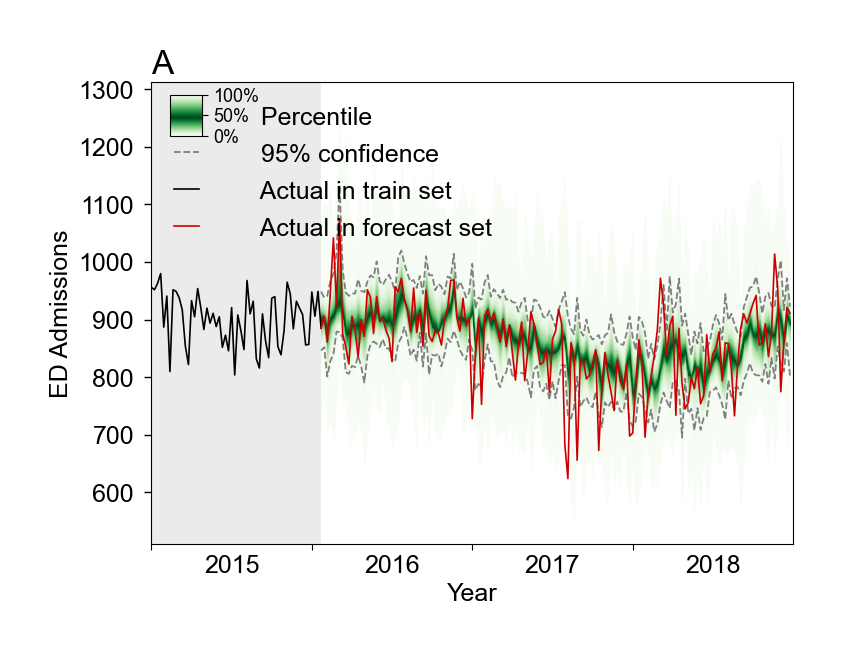

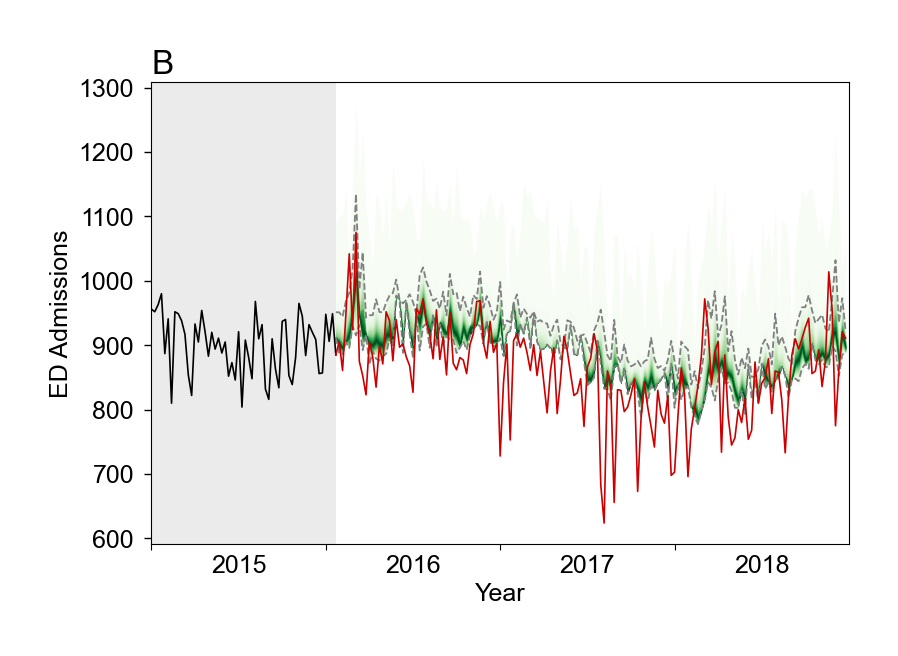

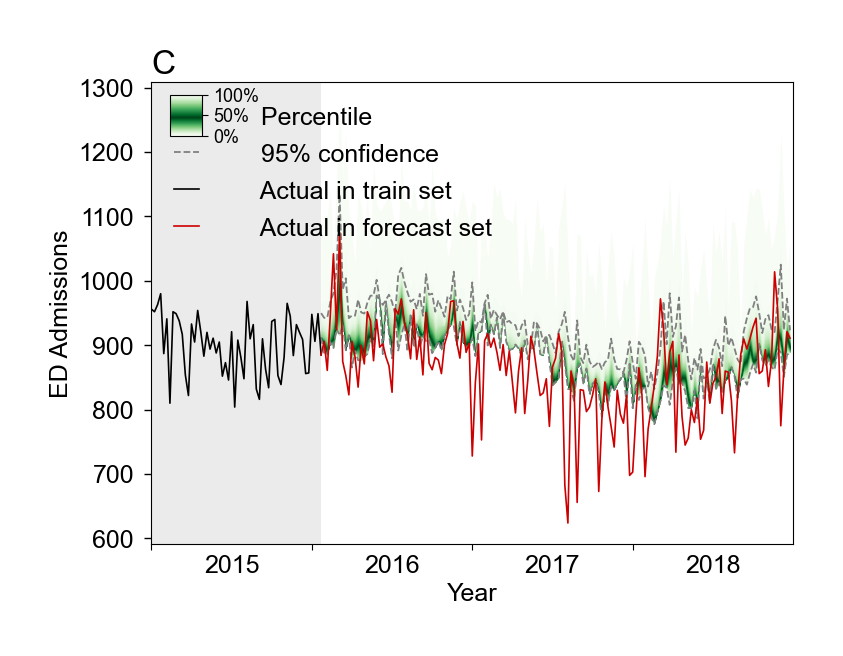

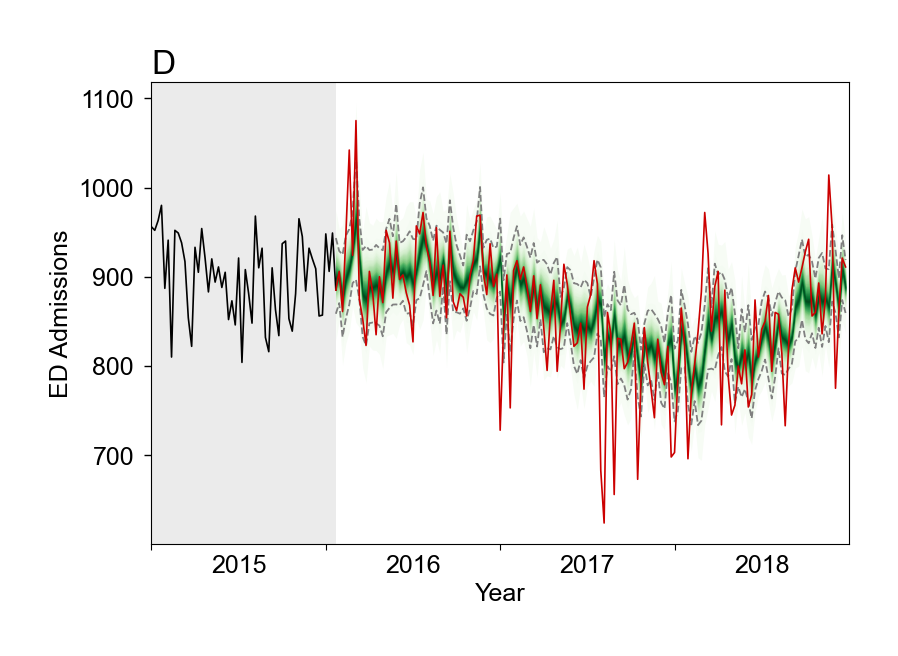

In [27]:
def single_plot(pred, lag, step, target_var, model, output_directory): # for density forecast submodels and combi density forecast
    labs = {'linearpool_P2': 'A', 'harmonicpool_P2': 'B', 'logpool_P2': 'C', 'vincentization_P2': 'D'}
    output_directory_path = os.path.join(output_directory, target_var)
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    output_file = os.path.join(output_directory_path, F'{model} {step}-week.pdf')
    
    y_pred = pred.copy()
    fig, ax1 = plt.subplots(1,1, figsize=(9,6))
    # Set the x-axis limits
    plt.xlim([0,len(pred)])

    # Shade the training dataset
    epiweek_values = list(y_pred.index.values)
    first_valid_index = epiweek_values.index(y_pred['0'].first_valid_index()) # becasue the length of columns '0'-'999' is different from column target_var
    plt.axvspan(0, first_valid_index, facecolor='#d9d9d9', alpha=0.5)
    

    
    # Plot the polygon
    percentiles = np.linspace(0, 100, 101)
    cmap = cm.get_cmap('Greens')

    add_lable = True
    for p in reversed(percentiles):
        if p >= 100-p:
            upper_bound = []
            lower_bound = []
            for index, row in y_pred.iterrows():
                upper_bound.append(np.percentile(np.array(row[1:-1]), p))
                lower_bound.append(np.percentile(np.array(row[1:-1]), 100 - p))
            color_intensity = 1 - (p - 50) / 50  # Closer to 50% is darker
            color = cmap(color_intensity)
            ax1.fill_between(y_pred['epiweekplot'], lower_bound, upper_bound, color=color, alpha=1, label='      Percentile' if add_lable else None)
            add_lable = False
    
    # Plot the line
    # Calculate and plot the 2.5% and 97.5% lines
    upper_95 = [np.percentile(np.array(row[1:-1]), 97.5) for _, row in y_pred.iterrows()]
    lower_95 = [np.percentile(np.array(row[1:-1]), 2.5) for _, row in y_pred.iterrows()]
    ax1.plot(y_pred['epiweekplot'], upper_95, color='grey', linestyle='--', linewidth=1.3, label='      95% confidence')
    ax1.plot(y_pred['epiweekplot'], lower_95, color='grey', linestyle='--', linewidth=1.3)    
    
    ax1.plot(y_pred['epiweekplot'][:first_valid_index+1], y_pred[target_var][:first_valid_index+1], label='      Actual in train set', linestyle='-', linewidth=1.2, alpha=1, color='black')
    ax1.plot(y_pred['epiweekplot'][first_valid_index:], y_pred[target_var][first_valid_index:], label='      Actual in forecast set', linestyle='-', linewidth=1.2, alpha=1, color='#CC0000')
    
    
    # Plot settings
    ax1.set_xticks(y_pred['epiweekplot'][::52])
    ax1.set_xticklabels("")
    
    ax1.set_xticks(y_pred['epiweekplot'][26::52], minor=True)
    start_range = int(y_pred['epiweekplot'][0][1:5])
    end_range = int(y_pred['epiweekplot'][-1][1:5])+1
    ax1.set_xticklabels(range(start_range,end_range), minor=True)

    ax1.tick_params(axis='x', which='minor', length=0, width=0, pad=7.5, labelsize=18)
    ax1.tick_params(axis='y', which='major', length=5, width=1, pad=7.5, labelsize=18)

    plt.title(F'{labs[model]}', fontsize=24, loc='left')
    plt.xlabel('Year', fontsize=18)
    plt.ylabel('ED Admissions', fontsize=18)




    # Add color bars
    if model == 'linearpool_P2' or model == 'logpool_P2':
        reversed_cmap = cmap.reversed()
        colors = cmap(np.linspace(0, 1, 100))  # First half (0-50)
        colors_reversed = reversed_cmap(np.linspace(0, 1, 128))  # Second half (50-100)
        symmetric_colors = np.vstack((colors, colors_reversed))  # Stack them vertically
        symmetric_cmap = LinearSegmentedColormap.from_list("symmetric_Greens", symmetric_colors)

        norm = Normalize(vmin=0, vmax=100)
        sm = ScalarMappable(cmap=symmetric_cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax1, orientation='vertical', fraction=0.03, shrink=0.08, aspect=1.3)
        cbar.ax.tick_params(labelsize=13)
        cbar.ax.set_position([0.146, 0.78, 0.035, 0.09])
        cbar.set_ticks([0, 50, 100])
        cbar.set_ticklabels(['0%', '50%', '100%'])


        plt.legend(loc='upper left', fontsize=18)
    plt.savefig(output_file)


def data_setup(lag, step, target_var, model):
    y_pred = pd.read_csv(F'{target_var}/combi_samples/L{lag}_S{step}/{model}.csv', parse_dates = [0], dayfirst = True)

    y_pred['epiweek'] = y_pred['epiweek'].apply(create_epiweek_fromstr)
    y_pred = y_pred.set_index('epiweek')
    y_pred = y_pred.drop(target_var, axis=1)


    y_full = pd.read_csv(F'{target_var}/initial_dataset.csv', parse_dates = [0], dayfirst = True)
    y_full['epiweek'] = y_full['epiweek'].apply(create_epiweek_fromstr)
    y_full = y_full.set_index('epiweek')
    y_full = y_full[[target_var]]
    y_full = y_full.shift(-step+1).dropna()


    y_pred_full = pd.concat([y_full.iloc[313:], y_pred], axis=1) # start from 201501
    y_pred_full['epiweekplot'] = y_pred_full.index
    y_pred_full['epiweekplot'] = y_pred_full['epiweekplot'].apply(create_epiweekplot)

    return y_pred_full

def plot_individual(lag, step, target_var, model, output_directory):
    y_pred = data_setup(lag, step, target_var, model)
    single_plot(y_pred, lag, step, target_var, model, output_directory)




def plot_disease(lag, step, target_var, model, output_directory):
    plot_individual(lag, step, target_var, model, output_directory)



for model in ['linearpool_P2', 'harmonicpool_P2', 'logpool_P2', 'vincentization_P2']:
    plot_disease(8, 1, 'Cardiovascular disease', model, 'distribution')

### plot PDF of 4 combinations

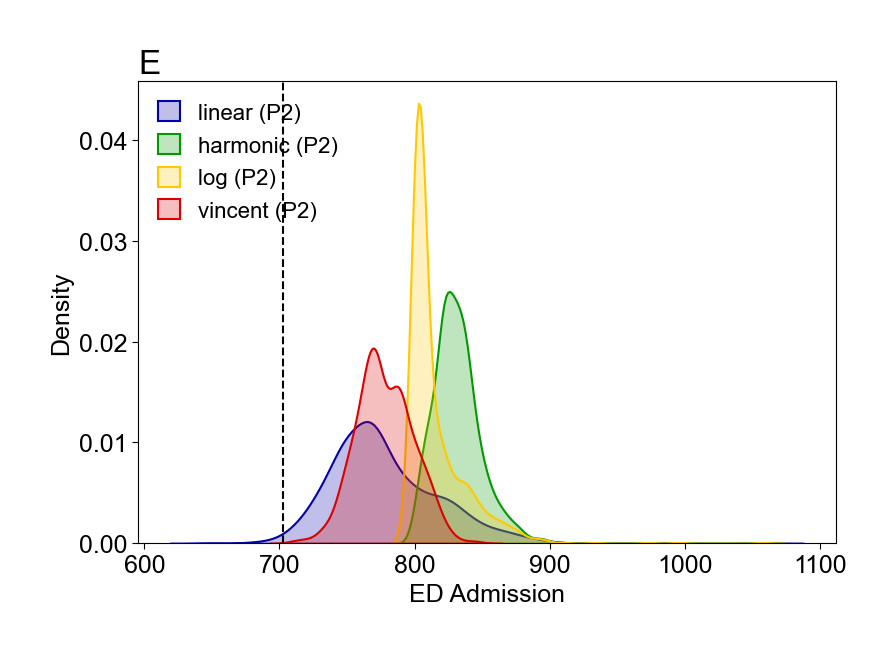

In [28]:
P2_combinaitons = ['linearpool_P2', 'harmonicpool_P2', 'logpool_P2', 'vincentization_P2']
plt.figure(figsize=(9, 6))
for model in P2_combinaitons:
    first_week_pred = pd.read_csv(F'Cardiovascular disease/combi_samples/L8_S1/{model}.csv', parse_dates = [0], dayfirst = True)
    first_week_pred['epiweek'] = first_week_pred['epiweek'].apply(create_epiweek_fromstr)
    first_week_pred = first_week_pred.set_index('epiweek') 

    data = first_week_pred.iloc[101, 1:].values  # Epiweek: 201801 


    sns.kdeplot(data, label=all_models[model], color = color_picker(model), linewidth=1.5, fill=True) # all_models is dictionary here
plt.axvline(x=first_week_pred.iloc[101, 0], linestyle='--', linewidth=1.5, color='black')
plt.title('E', fontsize=24, loc='left')
plt.xlabel('ED Admission', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.tick_params(axis='both', labelsize=18)
plt.legend(fontsize=16)
plt.savefig('distribution/Cardiovascular disease/201801_P2_combis.pdf')

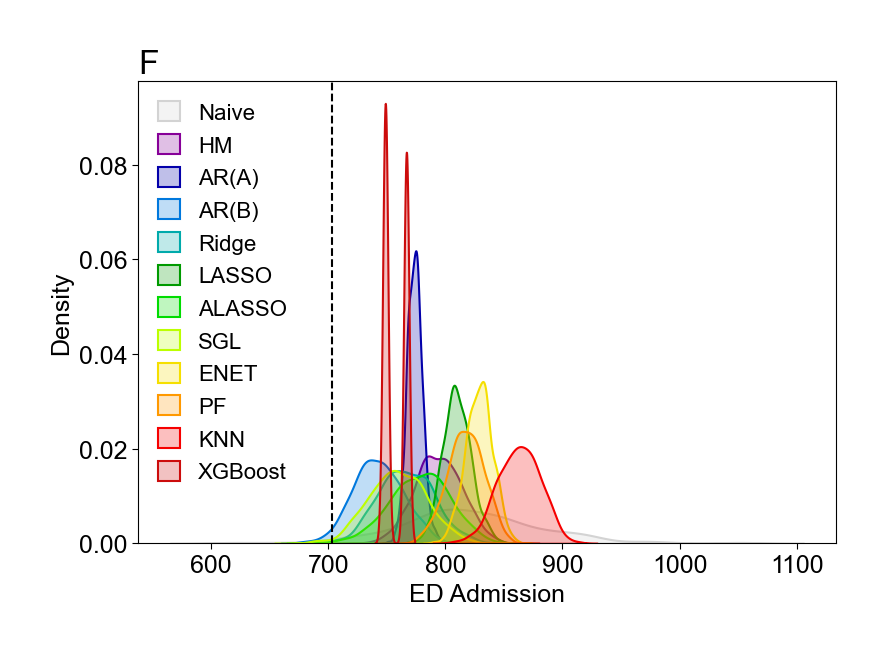

In [29]:
all_models_list = ['naive', 'historymean', 'ar_pure', 'ar_env', 'ridge', 'lasso', 'alasso', 'sgl',
                 'elasticnet', 'purefactor', 'knn', 'xgboost']
plt.figure(figsize=(9, 6))
for model in all_models_list:
    first_week_pred = pd.read_csv(F'Cardiovascular disease/pred/L8_S1/{model}.csv', parse_dates = [0], dayfirst = True)
    first_week_pred['epiweek'] = first_week_pred['epiweek'].apply(create_epiweek_fromstr)
    first_week_pred = first_week_pred.set_index('epiweek') 

    data = first_week_pred.iloc[101, 1:].values   

    if model == 'naive':
        sns.kdeplot(data, label=all_models[model], linewidth=1.5, color='lightgrey', fill=True)
    else:
        sns.kdeplot(data, label=all_models[model], linewidth=1.5, color=color_picker(model), fill=True) # all_models is dictionary here
plt.axvline(x=first_week_pred.iloc[101, 0], linestyle='--', linewidth=1.5, color='black')
plt.title('F', fontsize=24, loc='left')
plt.xlabel('ED Admission', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.tick_params(axis='both', labelsize=18)
plt.legend(fontsize=16)
plt.savefig('distribution/Cardiovascular disease/201801_individual.pdf')

## create the table for numbers of non-equivalence between simple models and combinations

In [19]:
all_combinations_P1 = ['linearpool_P1', 'harmonicpool_P1', 'logpool_P1', 'vincentization_P1']
all_combinations_P2 = ['linearpool_P2', 'harmonicpool_P2', 'logpool_P2', 'vincentization_P2']
all_combinations_P3 = ['linearpool_P3', 'harmonicpool_P3', 'logpool_P3', 'vincentization_P3']

def number_NE(target_variables_file, pvalue_directory, output_directory_path):
    if not os.path.exists(output_directory_path):
        os.makedirs(output_directory_path)
    disease_list = []
    with open(target_variables_file, 'r') as file:
        for line in file:
            # Remove linebreak which is the last character of the string
            target_variable = line[:-1]
            # Add item to the list
            disease_list.append(target_variable)
    num_df = pd.DataFrame(index=disease_list, columns=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
    for disease in disease_list:
        pvalue_dir = os.path.join(disease, pvalue_directory)
        for filename in os.listdir(pvalue_dir):
            pvalue_file = os.path.join(pvalue_dir, filename)
            if os.path.isfile(pvalue_file):
                pvalue = pd.read_csv(pvalue_file, parse_dates = [0], index_col = 0)
                MvsC = pvalue.loc[all_models, all_combinations]   # all_models vs all_combinations, P1, P2, P3
                num = (MvsC == -1).sum().sum()
                
                pos_S = filename.find('S') + 1  # +1 to start after 'S'
                pos_c = filename.find('.')
                # Extract the substring
                num_df.loc[disease, int(filename[pos_S:pos_c])] = num
    output_file = os.path.join(output_directory_path, 'num_of_NE_all.csv') # remember to change the name here for all the cases
    num_df.to_csv(output_file)

number_NE('target_variables_new.txt', 'pvalue', 'for_table')

### 测试

In [68]:
sb = create_error_df('Cardiovascular disease', 'density_forecast_metrics', 'crps_DENSITY_FORECAST')
sb

,naive,historymean,ar_pure,ar_env,ridge,lasso,alasso,sgl,elasticnet,purefactor,...,logpool_P3,vincentization_P3,linearpool_P2,harmonicpool_P2,logpool_P2,vincentization_P2,linearpool_P1,harmonicpool_P1,logpool_P1,vincentization_P1
1,48.366682,41.203110,44.961337,44.156662,41.889587,39.385381,39.533533,42.561471,40.052082,41.163881,...,46.909508,37.728937,28.060553,45.083033,43.817721,29.316424,35.720467,48.490577,47.033167,38.041283
2,49.866785,40.191155,47.343395,46.988764,44.951388,42.438397,42.673826,46.143732,42.174061,44.253992,...,48.365534,40.286965,30.453029,46.246877,45.151560,31.893617,38.454852,49.692906,48.437990,40.538600
3,49.623464,39.875167,46.435653,48.031673,44.424718,42.432876,42.138813,46.238642,42.388343,43.365737,...,48.257988,40.249434,30.755573,46.111900,44.802365,32.235917,38.404052,49.871128,48.368405,40.536519
4,45.911044,41.296781,45.922696,48.506930,42.674877,41.846804,40.713273,44.080679,42.409449,42.787100,...,51.406617,38.853634,29.799215,49.600190,48.481463,30.837954,37.618847,53.093226,51.559516,39.221962
5,47.176452,41.921349,46.282183,48.097245,44.191588,41.805295,42.066149,45.803073,42.546292,42.288400,...,48.501988,39.366682,30.156360,46.118464,44.689528,31.154640,38.134589,50.421699,48.658066,39.728791
6,50.233158,43.180913,47.827497,46.912866,44.346598,42.410880,41.543362,45.995265,42.459870,42.174699,...,48.811235,40.355349,30.334894,46.730180,45.020310,31.675036,38.533276,50.852094,48.898831,40.611855
7,52.604681,44.076557,46.395327,45.347912,43.091568,41.978660,41.492970,45.465445,41.989480,41.573403,...,48.171291,39.851630,31.175648,46.199595,44.838590,32.260973,38.425849,49.850044,48.266645,40.145846
8,53.768783,46.001510,46.099265,46.424533,43.257699,41.791760,40.172128,45.380684,41.495526,42.210184,...,49.158397,40.263321,31.849520,46.890393,45.762806,32.810409,38.784347,50.854839,49.199047,40.548454
9,50.539227,46.724647,47.029673,48.925638,44.360044,42.094060,42.468252,46.149403,41.868961,42.980899,...,47.214948,40.200153,31.112471,44.924203,43.726636,32.275701,38.766351,48.782351,47.322203,40.511037
10,52.977066,46.765717,46.395722,49.454696,44.454760,41.777766,42.407468,46.657510,41.624129,42.715959,...,46.042059,40.702114,31.136535,43.638181,41.935528,32.321167,38.874332,48.300556,46.152739,41.030828
